# YOLO V8

In [ ]:
!nvidia-smi

Wed Jun 12 13:50:53 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics==8.0.196

from IPython import display as ipython_display
ipython_display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.5/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nowie4JCIIwpU4LRWgXO")
project = rf.workspace("solandeer").project("road-signs-boyvj")
version = project.version(2)
dataset = version.download("yolov8")

mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8n.yaml data={dataset.location}/data.yaml epochs=15 plots=True

/content

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv        

/content


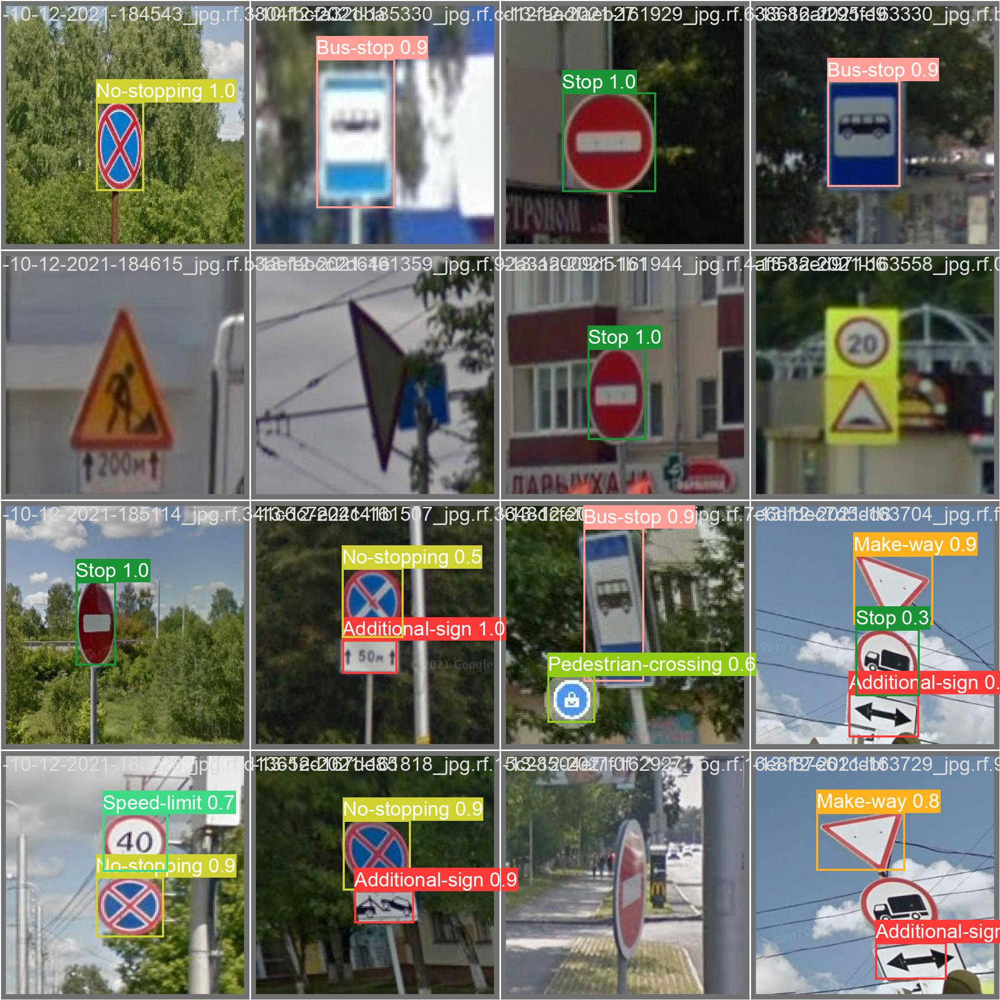

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/val_batch1_pred.jpg', width=600)

In [ ]:
yolo_model = YOLO('/content/runs/detect/train2/weights/best.pt')

# FAST R-CNN

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Obtaining file:///content/detectron2_repo
  Preparing metadata (setup.py) ... done
  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.6
    Uninstalling detectron2-0.6:
      Successfully uninstalled detectron2-0.6
  Running setup.py develop for detectron2


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import os
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow
from google.colab import files
from PIL import Image
import io
import matplotlib.pyplot as plt
import json
import itertools
import glob
!pip install roboflow
from roboflow import Roboflow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo

In [ ]:
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-t4_8i8iy
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-t4_8i8iy
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=375614 sha256=ad986bd723f7ee041db4b5036ef783315218256d4124e94a5511f570d3a417e9
  Stored in directory: /tmp/pip-ephem-wheel-cache-yjnq55hj/wheels/39/61/b4/480fbddb4d3d6bc34083e7397bc6f5d1381f79acc68e9f3511
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.7
    Uninstalling pycocotools-2.0.7:
      Successfully uninstalled pycocotools-2.0.7
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the f

In [ ]:
!curl -L "https://universe.roboflow.com/ds/5yWTQ4THrw?key=o3Tw9dFglL" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.8 MB/s eta 0:00:00
Reason for being yanked: deprecated, use 4.8.0.76
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.82
    Uninstalling opencv-python-headless-4.10.0.82:
      Successfully uninstalled opencv-python-headless-4.10.0.82
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cyc

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   3368      0 --:--:-- --:--:-- --:--:--  3374
100  146M  100  146M    0     0  20.5M      0  0:00:07  0:00:07 --:--:-- 23.3M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/-09-12-2021-183548_jpg.rf.29075d773c90f2d5b875ff56cd9b1cdf.jpg  
 extracting: test/-10-12-2021-175338_jpg.rf.bfc9593c0ec668bd69385746f1104afb.jpg  
 extracting: test/-10-12-2021-175351_jpg.rf.6688a873206af1826c02865204a52718.jpg  
 extracting: test/-10-12-2021-175424_jpg.rf.a3635a7739526fb3f31915269e34ed44.jpg  
 extracting: test/-10-12-2021-175442_jpg.rf.709e2e02dc1e3cceff9df848f169a2ee.jpg  
 extracting: test/-10-12-2021-175515_jpg.rf.29003b0ab3afa26023392f562c1b50de.jpg  
 extracting: test/-10-12-2021-175658_jpg.rf.43200402b94d3742fe596bd6

In [ ]:
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [06/15 10:06:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/15 10:06:22 d2.data.datasets.coco]: Loaded 2112 images in COCO format from /content/train/_annotations.coco.json


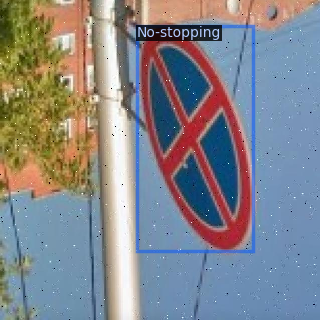

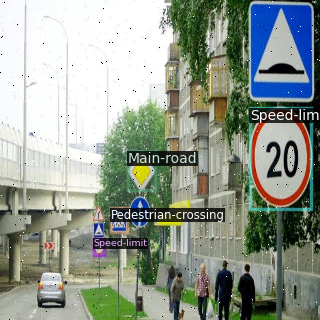

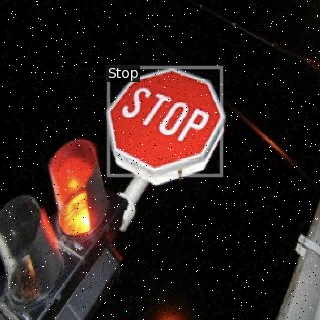

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_test",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025

cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000,)
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10 #your number of classes + 1
cfg.TEST.EVAL_PERIOD = 1000

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/15 10:06:51 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 88.7MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/15 10:06:54 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)


[06/15 10:07:04 d2.utils.events]:  eta: 0:07:46  iter: 19  total_loss: 3.088  loss_cls: 2.289  loss_box_reg: 0.6867  loss_rpn_cls: 0.02165  loss_rpn_loc: 0.01024    time: 0.3111  last_time: 0.3167  data_time: 0.0189  last_data_time: 0.0121   lr: 4.8275e-07  max_mem: 1736M
[06/15 10:07:19 d2.utils.events]:  eta: 0:07:13  iter: 39  total_loss: 3.006  loss_cls: 2.283  loss_box_reg: 0.6774  loss_rpn_cls: 0.03833  loss_rpn_loc: 0.006448    time: 0.2997  last_time: 0.2615  data_time: 0.0091  last_data_time: 0.0212   lr: 7.2775e-07  max_mem: 1736M
[06/15 10:07:25 d2.utils.events]:  eta: 0:07:11  iter: 59  total_loss: 2.975  loss_cls: 2.261  loss_box_reg: 0.6923  loss_rpn_cls: 0.01177  loss_rpn_loc: 0.004426    time: 0.2976  last_time: 0.3082  data_time: 0.0111  last_data_time: 0.0291   lr: 9.7275e-07  max_mem: 1737M
[06/15 10:07:31 d2.utils.events]:  eta: 0:07:05  iter: 79  total_loss: 2.956  loss_cls: 2.228  loss_box_reg: 0.6585  loss_rpn_cls: 0.01815  loss_rpn_loc: 0.004423    time: 0.3012 

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[06/15 10:09:41 d2.evaluation.evaluator]: Inference done 11/101. Dataloading: 0.0028 s/iter. Inference: 0.0809 s/iter. Eval: 0.0004 s/iter. Total: 0.0841 s/iter. ETA=0:00:07
[06/15 10:09:46 d2.evaluation.evaluator]: Inference done 71/101. Dataloading: 0.0020 s/iter. Inference: 0.0814 s/iter. Eval: 0.0004 s/iter. Total: 0.0839 s/iter. ETA=0:00:02
[06/15 10:09:48 d2.evaluation.evaluator]: Total inference time: 0:00:08.416621 (0.087673 s / iter per device, on 1 devices)
[06/15 10:09:48 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:07 (0.082980 s / iter per device, on 1 devices)
[06/15 10:09:49 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/15 10:09:49 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[06/15 10:09:49 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
[06/15 10:09:49 d2.evaluatio

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[06/15 10:12:26 d2.evaluation.evaluator]: Inference done 11/101. Dataloading: 0.0014 s/iter. Inference: 0.0815 s/iter. Eval: 0.0004 s/iter. Total: 0.0834 s/iter. ETA=0:00:07
[06/15 10:12:31 d2.evaluation.evaluator]: Inference done 58/101. Dataloading: 0.0049 s/iter. Inference: 0.0895 s/iter. Eval: 0.0096 s/iter. Total: 0.1042 s/iter. ETA=0:00:04
[06/15 10:12:35 d2.evaluation.evaluator]: Total inference time: 0:00:09.576523 (0.099755 s / iter per device, on 1 devices)
[06/15 10:12:35 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:08 (0.087445 s / iter per device, on 1 devices)
[06/15 10:12:35 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/15 10:12:35 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[06/15 10:12:35 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[06/15 10:12:35 d2.evaluatio

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[06/15 10:15:18 d2.evaluation.evaluator]: Inference done 11/101. Dataloading: 0.0014 s/iter. Inference: 0.0791 s/iter. Eval: 0.0004 s/iter. Total: 0.0809 s/iter. ETA=0:00:07
[06/15 10:15:23 d2.evaluation.evaluator]: Inference done 72/101. Dataloading: 0.0019 s/iter. Inference: 0.0805 s/iter. Eval: 0.0004 s/iter. Total: 0.0830 s/iter. ETA=0:00:02


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[06/15 10:15:26 d2.evaluation.evaluator]: Total inference time: 0:00:08.282502 (0.086276 s / iter per device, on 1 devices)
[06/15 10:15:26 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:07 (0.081448 s / iter per device, on 1 devices)
[06/15 10:15:26 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/15 10:15:26 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[06/15 10:15:26 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
[06/15 10:15:26 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[06/15 10:15:26 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.11 seconds.
[06/15 10:15:26 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[06/15 10:15:26 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.06 seconds.
 Average Precision  (AP

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
%ls ./output/

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[06/15 10:17:08 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


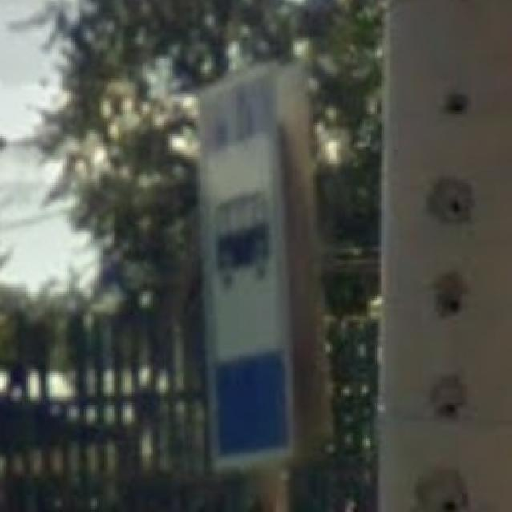

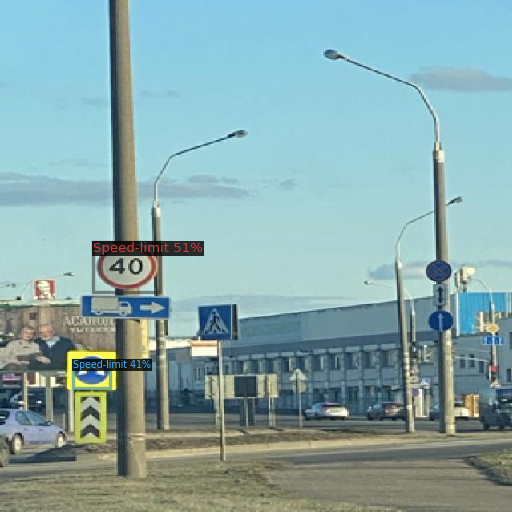

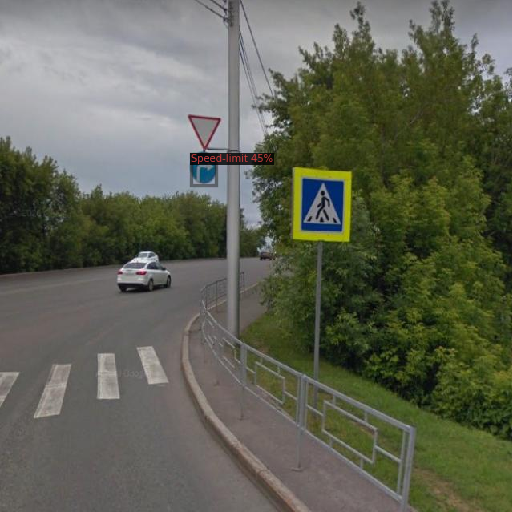

In [ ]:
for imageName in random.sample(glob.glob('/content/test/*jpg'), 3):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

# INPUT USER

Saving -10-12-2021-184855_jpg.rf.cbe59cf140ea98dac31216821d09221e.jpg to -10-12-2021-184855_jpg.rf.cbe59cf140ea98dac31216821d09221e (2).jpg


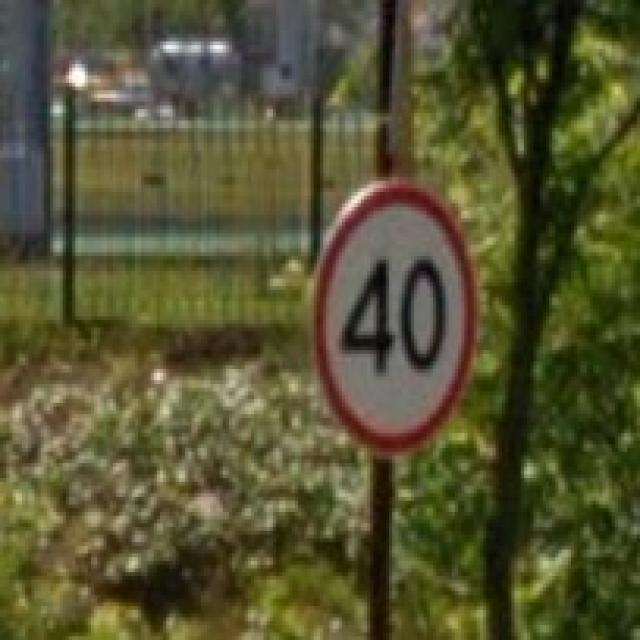

In [ ]:
uploaded = files.upload()

image_path = next(iter(uploaded))
im = cv2.imread(image_path)
cv2_imshow(im)

Pilih model untuk memproses gambar:
1: YOLO
2: Faster R-CNN
Masukkan pilihan (1/2): 1



0: 640x640 1 Speed-limit, 27.4ms
Speed: 3.1ms preprocess, 27.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


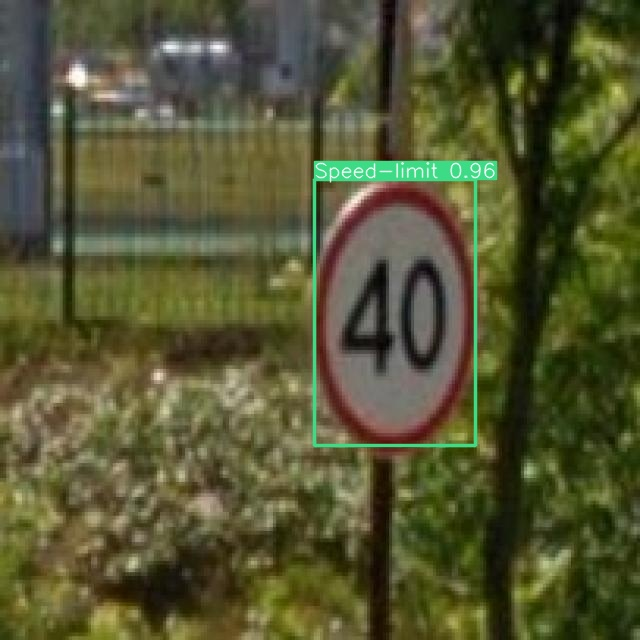

In [ ]:
print("Pilih model untuk memproses gambar:")
print("1: YOLO")
print("2: Faster R-CNN")
model_choice = input("Masukkan pilihan (1/2): ")

if model_choice == "1":
    results = yolo_model(im)
    for result in results:
        result_img = result.plot()
        result_image_path = "yolo_prediction.jpg"
        cv2.imwrite(result_image_path, result_img)
        display(Image(filename=result_image_path))

elif model_choice == "2":
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10
    cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4
    predictor = DefaultPredictor(cfg)

    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
               metadata=MetadataCatalog.get("my_dataset_test"),
               scale=0.8
              )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    cv2_imshow(out.get_image()[:, :, ::-1])
else:
    print("Pilihan tidak valid. Silakan masukkan 1 atau 2.")